***

In [2]:
from scipy.io import wavfile
import IPython
import os
import numpy as np
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt

### Directorios de entrada y salida

Estos directorios se especifican para indicar de dónde se extraerán los ficheros de sonido a procesar y dónde se volcarán los audios modificados.

In [3]:
cwd = os.getcwd()
audio_input_path = os.path.join(cwd, os.path.join('audio', 'examples'))
audio_output_path = os.path.join(cwd, os.path.join('audio', '_output'))
print(f'Directorio con los audios de entrada: {audio_input_path}')
print(f'Directorio donde guardaremos los audios generados: {audio_output_path}\n')

Directorio con los audios de entrada: /home/efraileg/Asignaturas/Multimedia/Tema3_Audio/PracticasAudio/SistemasMultimedia-Audio/Practica2_SSM/audio/examples
Directorio donde guardaremos los audios generados: /home/efraileg/Asignaturas/Multimedia/Tema3_Audio/PracticasAudio/SistemasMultimedia-Audio/Practica2_SSM/audio/_output



### Cargar el archivo de audio

Diferencias entre formatos de archivo para almacenar audio digital.

<ul>
    <li><b>Formato .wav</b>: Este formato permite tener un archivo de audio sin comprimir por lo que no se pierde información por el camino consiguiendo máxima calidad y por lo tanto el tamaño del archivo es grande.</li>
    <li><b>Formato .mp3</b>: Este formato permite tener un archivo de audio comprimido por lo que, a diferencia del anterior formato, éste tiene pérdida de calidad aunque reduce el tamaño del archivo final.</li>
</ul>

Considerando el directorio de entrada de audios indicados anteriormente, se carga un archivo de audio .wav.

In [20]:
# Se carga el archivo de audio.
filename = os.path.join(audio_input_path, 'interstellar.wav')
sample_rate, audio_data = wavfile.read(filename)

print(f'Frecuencia de muestreo (sample rate): {sample_rate/1000} kHz')

Frecuencia de muestreo (sample rate): 44.1 kHz


Se indica la frecuencia de muestreo para poder reproducir el audio procesado.

In [5]:
IPython.display.Audio(audio_data.T, rate=sample_rate) # El audio pasado por parametro es estereo y para poder procesar su sonido es necesario su frecuencia de muestro ya que indica cada cuánto capturar los valores en frecuencia de la señal.

### Mostrar principales características de la onda

Al ser un audio estéreo se escuchará por ambos canales de diferente manera.

In [6]:
# Mostrar informacion (sonido estéreo).
print('Datos de audio (estereo):')
print(f'- Tamaño:     {audio_data.shape}')  # El tamaño viene dado por la variable "shape".
print(f'- 1º canal:   {audio_data[:5, 0]}...') # Los valores del primer canal se extraen al seleccionar las 5 primeras columnas de la primera dimensión.  
print(f'- 2º canal:   {audio_data[:5, 1]}...') # Los valores del segundo canal es igual que el primero con la diferencia de seleccionar la segunda dimensión.
print(f'- Resolucion: {(audio_data[0,0])}\n')

print(f'Tamaño en MB: {audio_data.nbytes / (1024*1024)}') # Se extrae el numero de Bytes que ocupa el audio y se convierten a MB.

Datos de audio (estereo):
- Tamaño:     (653748, 2)
- 1º canal:   [-13931  -4595  -2224  -7291 -10643]...
- 2º canal:   [ 5046 10532  9596 13510 23106]...
- Resolucion: -13931

Tamaño en MB: 2.4938507080078125


**Convertir el audio de estéreo a mono**

In [22]:
# Para convertir el audio de estéreo a mono se calcula la media por canal consiguiendo que el audio salga de la misma manera por ambos canales.
# Se convierte a mono mediante la media por canal (simplificacion).
new_data_mono = audio_data.mean(axis=1)  # Calculo de la media por canal.
print('Nuevos datos de audio (mono):')
print(f'- Nuevo tamaño: {new_data_mono.shape}')
print(f'- Canal unico:  {new_data_mono[:5]}...') # Al igual que antes, se muestran los valores de las cinco primeras columnas y no se especifica dimensión porque no hay ningun canal por los que distribuir de manera distinta el audio.

# Se mantiene la misma resolucion que antes.
new_data_mono = new_data_mono.astype(np.int16)
print(f'- Resolucion:   {type(new_data_mono[0])}\n')

Nuevos datos de audio (mono):
- Nuevo tamaño: (2171299,)
- Canal unico:  [1143.5 1321.5 1491.5 1650.5 1778. ]...
- Resolucion:   <class 'numpy.int16'>



**El nuevo audio mono se guarda**

In [23]:
# Se guarda el archivo mono a un fichero de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, 'sample1_mono.wav'),
    rate=sample_rate,
    data=new_data_mono
)

**Reproducir el audio nuevamente con el cambio a mono**

In [24]:
velocidad=1
IPython.display.Audio(new_data_mono, rate=sample_rate*velocidad) # Esta vez no se escucha diferente por ambos canales.

**Representación de la grafica en el dominio del tiempo**

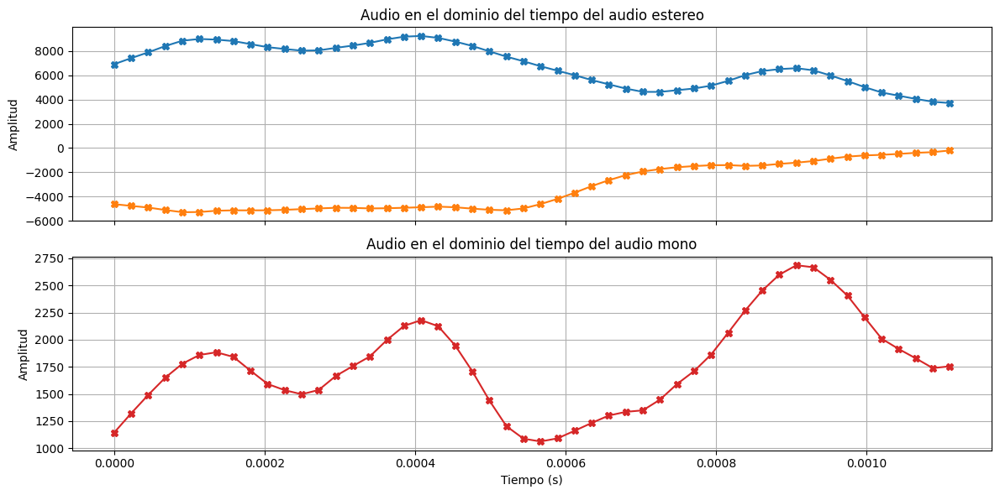

In [25]:

# Para mayor claridad, se vuelven a extraer los valores de "sample_rate" y "audio_data" de los dos tipos de audio.
filename = os.path.join(audio_input_path, 'interstellar.wav')
sample_rate_stereo, audio_stereo = wav.read(filename)

filename = os.path.join(audio_output_path, 'sample1_mono.wav')
sample_rate_mono, audio_mono = wav.read(filename)

# Se extraen las amplitudes de ambos audios
ampl_values_stereo = len(audio_stereo)
ampl_values_mono = len(audio_mono)

# Se construye el array para el eje x que representa el tiempo de la grabación
t1 = np.arange(0, ampl_values_stereo/sample_rate_stereo, 1/sample_rate_stereo)
t2 = np.arange(0, ampl_values_mono/sample_rate_mono, 1/sample_rate_mono)

# Creamos la figura.
fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

# Solo mostramos las primeras 50 muestras de amplitud (por claridad).
end = 50

# Audio estereo
ax[0].plot(t1[:end], audio_stereo[:end], marker='X')
ax[0].set_title(f'Audio en el dominio del tiempo del audio estereo')
ax[0].set_ylabel('Amplitud')
ax[0].grid(True)

# Audio mono
# Utilizamos ratio para ajustar el eje x de ambas gráficas
# ya que la fs es menor en esta señal.
ratio = sample_rate_stereo / sample_rate_mono  
ax[1].plot(t2[:int(end/ratio)], audio_mono[:int(end/ratio)], c='tab:red', marker='X')
ax[1].set_title(f'Audio en el dominio del tiempo del audio mono')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Amplitud')
ax[1].grid(True)

# Mostramos la figura.
plt.tight_layout()
plt.show()

Un audio estéreo implica que tenga dos canales por los cuales el sonido saldrá de diferente manera y es muy utilizado cuando se quiere dar un toque de realismo y ambientación.

En cambio, un audio mono implica que solo hay un canal por el cual el sonido será distribuido escuchandose de la misma forma. 

Es notorio usando audífonos ya que el primer caso el sonido viaja de un audífono a otro mientras que en el segundo caso el sonido se escucha de manera equitativa por ambos. 

**Frecuencia de muestreo, aliasing, profundidad de bits, ancho de banda y tasa de bits**

La frecuencia de muestreo es el ritmo con el que se capturan las diferentes componentes en frecuencia de una onda o señal de información. Este tipo de frecuencia es el ritmo con el que capturar los diferentes valores de frecuencia para que la señal pueda reconstruirse adecuadamente. Se asemeja a la sincronización que debe tener un fotógrafo para obtener una buena foto de un grupo de personas sin que salga borrosa o de mala calidad.

El aliasing es un error a la hora de extraer los valores en frecuencia de la señal, capturando valores en frecuencia sin llevar el "ritmo" correcto construyendo una señal totalmente incorrecta.

La profundidad de bits indica cuántos bits se dedican para medir la onda o señal de información. Suele graficarse como una matriz de pixeles donde cada fila de pixeles representa un segundo de señal capturada.

El ancho de banda es la combinación de la profundidad de bits y la frecuencia de muestreo, en conjunto y trabajando adecuadamente se consigue un ancho de banda adecuado. Esto representa la precisión con la que se ha capturado y reconstruido la señal siendo de mayor calidad cuanto mayor ancho de banda se haya conseguido.

La tasa de bits es una unidad de medida que representa el flujo de bits que se procesan en un determinado tiempo.

**Transformada de Fourier**

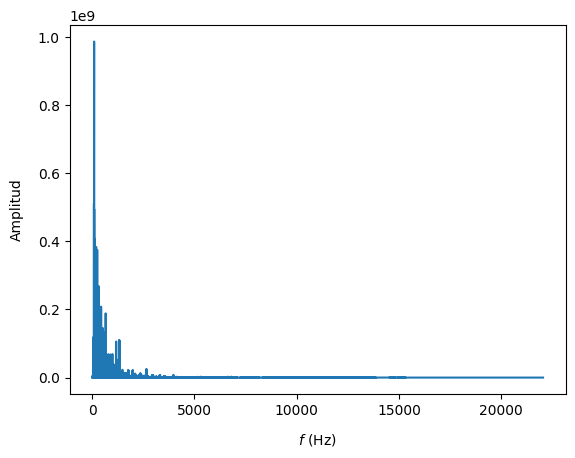

In [26]:
n = len(audio_mono)                             # Longitud del array de datos del audio mono.
Fs = sample_rate_mono

ch_Fourier = np.fft.fft(audio_mono)             # Se calcula la Transformada Rapida de Fourier (FFT) en audio mono.
abs_ch_Fourier = np.absolute(ch_Fourier[:n//2])   # Es de interés unicamente las frecuencias por debajo de Fs/2. Se atiende al Teorema de muestreo de Nyquist-Shannon.

plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)    # Eje de tiempo para el audio mono.
plt.ylabel('Amplitud', labelpad=10)
plt.xlabel('$f$ (Hz)', labelpad=10)
plt.show()

# Si se selecciona el audio estéreo se podrá apreciar una gráfica con valores en dos colores distintos, uno por cada canal.
# Al seleccionar el audio mono se apreciará unicamente una gráfica con valores de un solo color ya que solo hay un canal.

La explicación detras de la Transformada de Fourier radica en la dificultad de análisis del conjunto de frecuencias que componen la señal.
La Transformada Rápida de Fourier facilita cambiar una representación en el dominio del tiempo a una representación en el dominio de la frecuencia pudiendo manipular su intesidad y qué tipo de frecuencia están presentes.

Anteriormente se ha mostrado la señal en el dominio del tiempo y está presente una sola onda oscilante que no aporta toda la información necesaria para analizarla.

Una vez se convierte en el dominio de la frecuencia se pueden clasificar las frecuencias que son más agudas, más graves y su intensidad.
Toda frecuencia que tenga un bajo nivel de energía puede llegar a ser descartada para que, al comprimir el audio, no se pierda calidad en el proceso y, si se pierde, será un valor despreciable no detectable por el oído humano.

Es decir, si se tiene un audio donde la gran parte de su señal está compuesta por frecuencias de energía tan elevadas que el oído humano no las percibe se está ocupando demasiado espacio para conservar un audio que no se percibe.
Esto no solo ayuda en la reducción de espacio sino en la calidad del audio al ignorar frecuencias que pueden corresponder a ruido y que no aporta efectos positivos al audio más que volverlo inaudible

**Energia del espectrograma**

Epsilon: 0.101
Valor de corte para la energia del espectro: 721812091751.2664
Mascara: [False False False ...  True  True  True]
Frecuencia de corte f0 (Hz): 2957


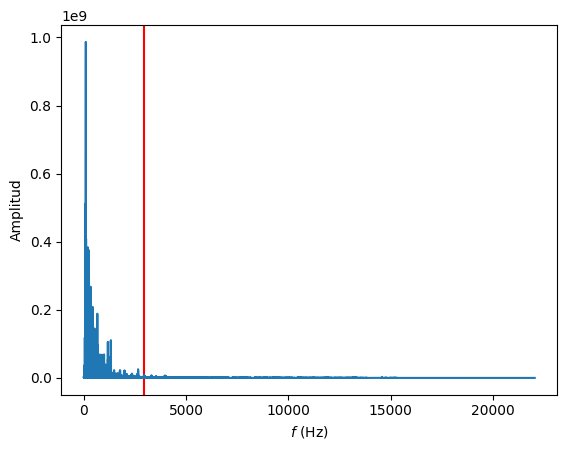

In [ ]:
eps = [1e-5, .02, .041, .063, .086, .101, .123]

eps = eps[5]
print(f'Epsilon: {eps}')

thr_spec_energy = (1 - eps) * np.sum(abs_ch_Fourier)
print(f'Valor de corte para la energia del espectro: {thr_spec_energy}')


spec_energy = np.cumsum(abs_ch_Fourier)

frequencies_to_remove = thr_spec_energy < spec_energy  
print(f'Mascara: {frequencies_to_remove}')

# La frecuencia f0 por la que cortamos el espectro.
f0 = (len(frequencies_to_remove) - np.sum(frequencies_to_remove)) * (Fs/2) / (n//2)
print(f'Frecuencia de corte f0 (Hz): {int(f0)}')

# Graficamos.
plt.axvline(f0, color='r')
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Amplitud')
plt.xlabel('$f$ (Hz)')
plt.show()

Partiendo del concepto de energía, se pretende encontrar un punto en el espectograma donde se concentre la gran mayoria de la energía la señal para poder descartar el resto de frecuencias a partir de ese punto.

El calculo de la energía se realiza a partir de la Transformada Rápida de Fourier ya que se suman cada una de las amplitudes de las frecuencias al cuadrado hasta llegar a un umbral de energía total acumulada específico. Este umbral de energia acumulada lo marca epsilon.

Para un epsilon de 0.75 se pretende encontrar el punto en la señal donde se acumule el 75% de la energía total para poder descartar el resto de frecuencias a partir de ese punto por ineficiencia o pérdida de calidad a la hora de considerar un pequeño porcentaje de energía total.

Este punto a encontrar en base al umbral marcado por epsilon es un valor de frecuencia específico de la señal en la cual se acumula epsilon*100% de la energía acumulada requerida.

Para esta ocasión se ha elegido un epsilon de 0.101 ya que, dado el audio mono seleccionado, la gran parte de la energía de la señal se encuentra por debajo de los 5 KHz y se puede permitir un valor de epsilon bajo. Este valor de epsilon establece un umbral de energía acumulada que no supere el 10.1% de la energía total buscando una frecuencia f_0 a lo largo del eje x hasta la cual se haya acumulado dicho valor de energía.

Este bajo valor de energía por parte de la señal se debe a que sus frecuencias son mayoritariamente graves y de baja energía. 

**Comprimir la onda aplicando downsampling**

In [28]:
# Calculamos el factor D de downsampling.
D = int(Fs / f0)
print(f'Factor de downsampling: {D}')

# Obtenemos los nuevos datos (slicing with stride).
new_data = audio_mono[::D]

# Definimos el nombre del audio comprimido generado.
wav_compressed_file = "sample_mono_compressed.wav"

# Escribimos los datos a un archivo de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, wav_compressed_file),
    rate=int(Fs/D),
    data=new_data
)

# Cargamos el nuevo archivo comprimido.
new_sample_rate, new_audio_data = wavfile.read(filename=os.path.join(audio_output_path, wav_compressed_file))


IPython.display.Audio(new_audio_data, rate=new_sample_rate)

Factor de downsampling: 2


**Espectograma**

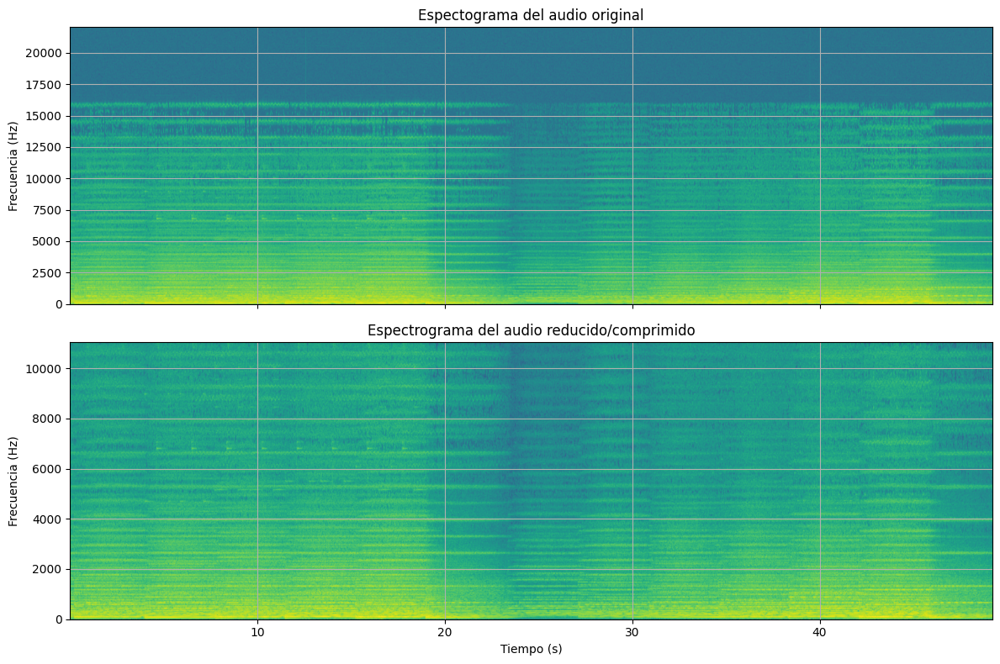

In [33]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

Pxx, freqs, bins, im = ax[0].specgram(audio_mono, NFFT=1024, Fs=sample_rate_mono, noverlap=512)
ax[0].set_title('Espectograma del audio original')
ax[0].set_ylabel('Frecuencia (Hz)')
ax[0].grid(True)

Pxx, freqs, bins, im = ax[1].specgram(new_audio_data, NFFT=1024, Fs=new_sample_rate, noverlap=512)
ax[1].set_title('Espectrograma del audio reducido/comprimido')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Frecuencia (Hz)')
ax[1].grid(True)

plt.tight_layout()
plt.show()

Se perciben dos espectogramas de dos audios cuya unica diferencia es ser mono comprimido o mono original.
En el espectograma del audio original el espectrograma muestra contenido hasta una frecuencia máxima de 16.250 KHz mientras que en el otro espectograma se aprecia contenido en un rango amplio de frecuencias alcanzando los 10 KHz.

Esta diferencia en el rango de frecuencias que ocupan viene dada por la compresión de audio perdiendo en el proceso componentes en frecuencia que reducen el rango de frecuencias alcanzable.

El espectograma del audio original tiene energía distribuida hasta frecuencias altas mientras que en el audio comprimido las frecuencias por encima de f_0 no se perciben debido a la eliminación de frecuencias por encima de este punto f_0 localizado en base al umbral epsilon impuesto anteriormente.

**Tamaño de los archivos en MB**

In [38]:
print(f'Tamaño del audio original   : {audio_mono.nbytes / (1024*1024)} MB') # Se extrae el numero de Bytes que ocupa el audio y se convierten a MB.
print(f'Tamaño del audio comprimido : {new_audio_data.nbytes / (1024*1024)} MB')

Tamaño del audio original   : 4.141424179077148 MB
Tamaño del audio comprimido : 2.0707130432128906 MB


**Reproducir audios original y comprimido**

In [15]:
IPython.display.Audio(audio_mono, rate=sample_rate_mono)

In [16]:
IPython.display.Audio(new_audio_data, rate=new_sample_rate)